# Project \#1 - 💵 Analyze NYSE Data


## Introduction

In this project, I am required to complete 3 separate tasks using Excel and Powerpoint.

   1) Conduct exploratory data analysis (EDA) and create a presentation sharing my findings

   2) Develop a dashboard for a Profit & Loss statement
    
   3) Create a financial Forecasting Model using three scenarios
---

## Task \#1 - Complete and create a presentation

For this task, I have been asked to conduct EDA and create a presentation regarding **at least** one categorical variable (such as the GICS Sector and/or subindustry) and one quantitative variable that requires the use of several summary statistics, i.e. measures of central tendency and measures of spread.

After reviewing the dataset, I will focus my analysis on the healthcare sector, comparing the performance of the various subindustries, as well as the healthcare sector as a whole.

### Asking Questions

In order to begin comparing each of the subindustries, I have developed a series of questions to compare the performance of the healthcare's subindustries against the entire healthcare sector. These questions include:

   1) Which subindustries have outperformed and underperformed the **mean** gross margin & mean operating margin of the entire sector?
   2) In comparing the **median** gross margin & median operating margin, which subindustries have outperformed and underperformed the sector?
   3) How well does the gross and operating mean represent the subindustries?
   4) How is the **spread** across the sector? Is the data skewed or symmetrical? Are there **outliers** in the sector?
   5) Which subindustries have a mean gross margin 1 standard deviation above and 1 SD below the mean gross margin of the sector?

### Calculate Summary Statistics and Create presentation

First, we need to create new columns for both the gross and operating profit for each company and year, allowing us to  calculate the gross and operating margins for our summary statistics and our performance comparison.

We'll begin by importing pandas to view the raw .csv file provided.

In [1]:
import pandas as pd
raw_df = pd.read_csv("projectdata-nyse.csv")

raw_df.head()

,Unnamed: 0,Ticker Symbol,Years,Period Ending,Total Revenue,Cost of Goods Sold,"Sales, General and Admin.",Research and Development,Other Operating Items,GICS Sector,GICS Sub Industry
0,0,AAL,Year 1,12/31/2012,"$24,855,000,000","$10,499,000,000","$12,977,000,000",$-,"$845,000,000",Industrials,Airlines
1,1,AAL,Year 2,12/31/2013,"$26,743,000,000","$11,019,000,000","$12,913,000,000",$-,"$853,000,000",Industrials,Airlines
2,2,AAL,Year 3,12/31/2014,"$42,650,000,000","$15,620,000,000","$20,686,000,000",$-,"$1,295,000,000",Industrials,Airlines
3,3,AAL,Year 4,12/31/2015,"$40,990,000,000","$11,096,000,000","$21,275,000,000",$-,"$1,364,000,000",Industrials,Airlines
4,4,AAP,Year 1,12/29/2012,"$6,205,003,000","$3,106,967,000","$2,440,721,000",$-,$-,Consumer Discretionary,Automotive Retail


We calculate **Gross Profit** as:

    =[@[ Total Revenue ]]-[@[ Cost of Goods Sold ]]

and **Operating Profit** as: 

    =[@[Gross Profit]]-[@[ Sales, General and Admin. ]]-[@[ Research and Development ]]-[@[ Other Operating Items ]]


We can use these new columns to now calculate the respective margins:

    **Gross Margin** =[@[Gross Profit]]/[@[ Total Revenue ]]

    **Operating Margin** =[@[Operating Profit]]/[@[ Total Revenue ]]


Let's load the new, Excel dataset

In [2]:
new_df = pd.read_excel("project-analyze-nyse-cleaned.xlsm", sheet_name="Project Data NYSE")

new_df.head()

,Column1,Ticker Symbol,Years,Period Ending,Total Revenue,Cost of Goods Sold,Gross Profit,"Sales, General and Admin.",Research and Development,Other Operating Items,Operating Profit,GICS Sector,GICS Sub Industry,Gross Margin,Operating Margin,Unnamed: 15,Ticker Symbol.1,Years.1,Biotechnology
0,0,AAL,Year 1,2012-12-31,24855000000,10499000000,14356000000,12977000000,0,845000000,534000000,Industrials,Airlines,0.577590,0.021485,NaN,AAL,Year 1,ALXN
1,1,AAL,Year 2,2013-12-31,26743000000,11019000000,15724000000,12913000000,0,853000000,1958000000,Industrials,Airlines,0.587967,0.073215,NaN,AAP,Year 2,AMGN
2,2,AAL,Year 3,2014-12-31,42650000000,15620000000,27030000000,20686000000,0,1295000000,5049000000,Industrials,Airlines,0.633763,0.118382,NaN,AAPL,Year 3,BIIB
3,3,AAL,Year 4,2015-12-31,40990000000,11096000000,29894000000,21275000000,0,1364000000,7255000000,Industrials,Airlines,0.729300,0.176994,NaN,ABBV,Year 4,CELG
4,4,AAP,Year 1,2012-12-29,6205003000,3106967000,3098036000,2440721000,0,0,657315000,Consumer Discretionary,Automotive Retail,0.499280,0.105933,NaN,ABC,NaN,GILD


Below is a screenshot of the Excel master table.

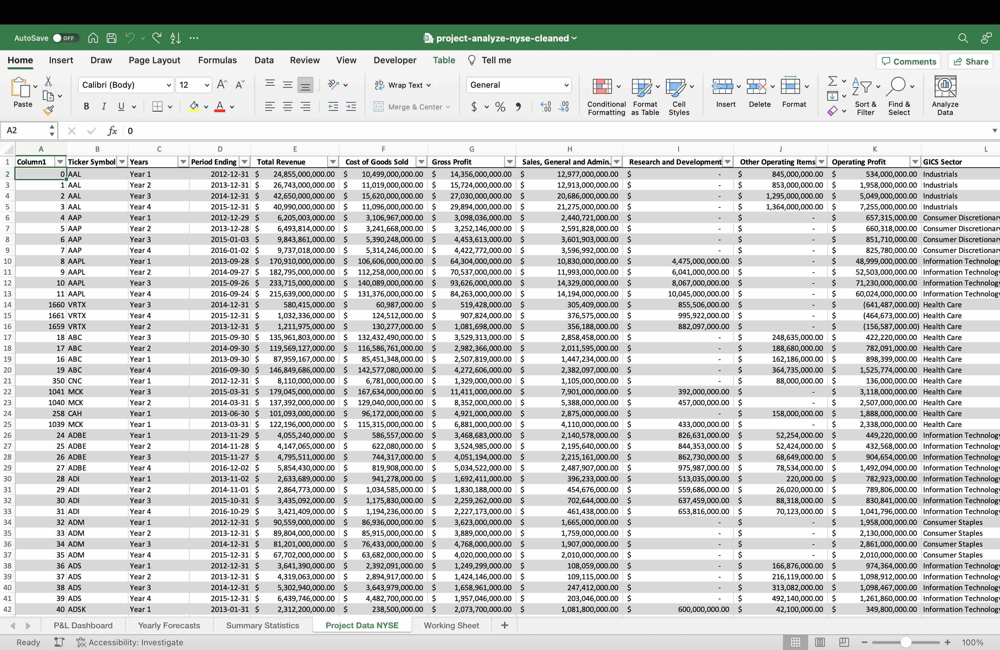

Now that we have calculated the gross and operating margins, we can calculate some summary statistics for the entire sector and each individual subindustry.
In calculating the mean gross margin, we want to use the **AVERAGEIF** function, since we want to include only the gross margins of companies equal to the subindustry we will be averaging for. The syntax for the function is as follows:

_=AVERAGEIF(range, criteria, [average_range])_

Starting from the Biotechnology subindustry and continuing down to fill in the summary table, our range will be **'Project Data NYSE'\\$M:\\$M**, creating an absolute reference for the entire row M, while our criteria is **'Summary Statistics'!$A5**, applying a relative reference to column A only. The average_range will pull from the gross margin column **'Project Data NYSE'\\$N:\\$N**, once again using absolute references. The formula therefore is:
 
_=AVERAGEIF('Project Data NYSE'!\\$M:\\$M,'Summary Statistics'!$A5,'Project Data NYSE'!\\$N:\\$N)_

In addition to the mean gross margin, we can calculate the mean **operating margin** using the AVERAGEIF function again.

_=AVERAGEIF('Project Data NYSE'!\\$M:\\$M,'Summary Statistics'!$A21,'Project Data NYSE'!\\$O:\\$O)_

When calculating the margins for the entire healthcare sector, we simply match the sector "Health Care" against the GICS sector instead.

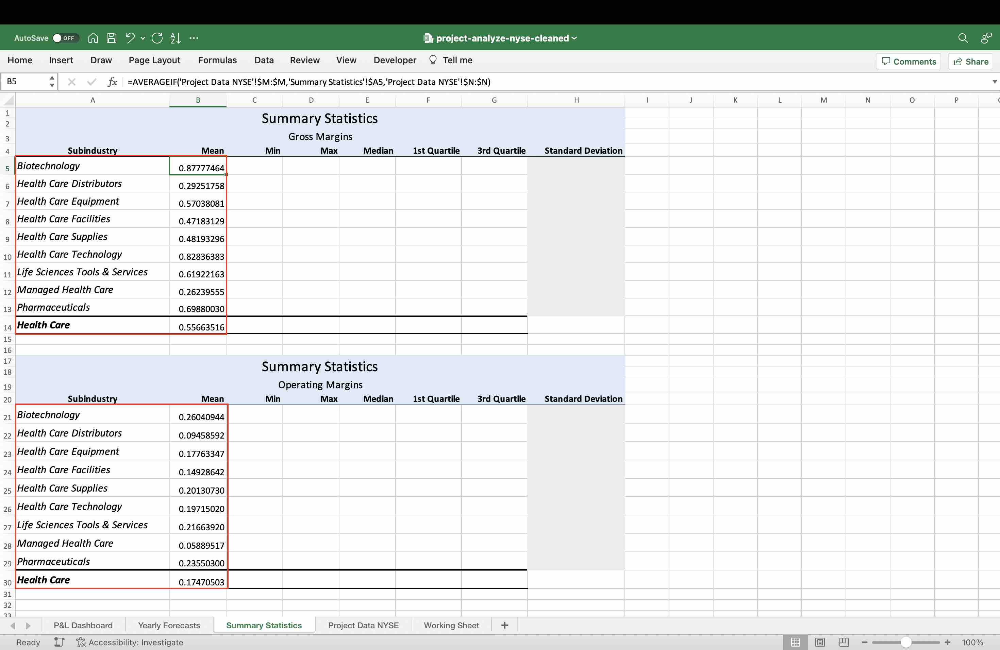

Let's plot both the mean gross margins and mean operating margins using a bar chart to highlight the overperforming and underforming subindustries when compared to the sector.

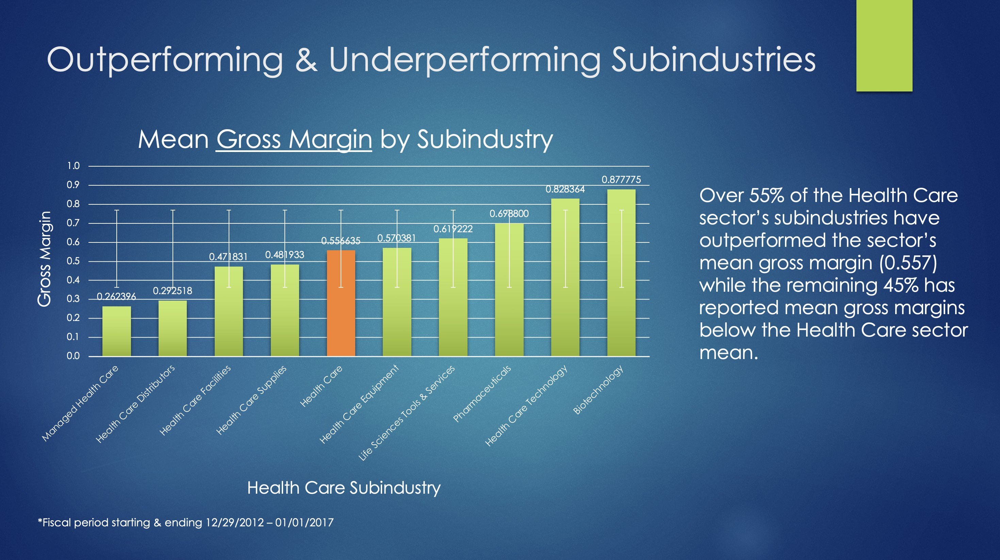

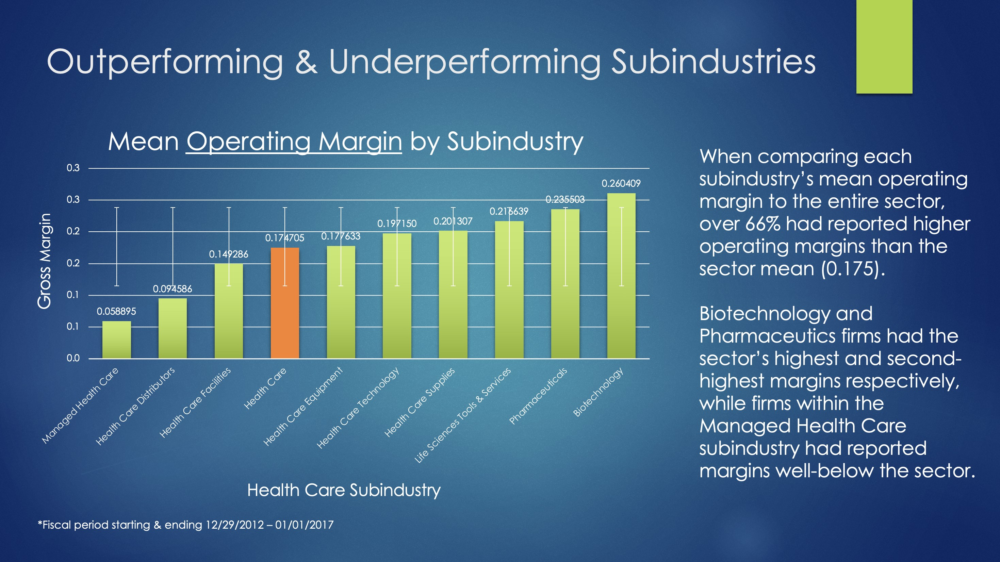

In comparing the median gross margins and median operating margins of each subindustry against the sector, I will also calculate additional summary statistics, including the minimum, maximum, and 1st & 3rd quartiles.

In order to calculate these summary statistics, we will have to use some nested functions, particulary the **IF** function nested inside the **MIN, MEDIAN & MAX** functions. Each of these formulas will follow a similar syntax, so let's begin with creating the **IF** function. Here is the syntax:

_=IF(logical_test, [value_if_true], [value_if_false])_

The first argument in the function is our logical test, which I will set to iterate through the GICS Subindustry column, comparing each subindustry name against the name in column A within the summary table. Excel evaluates each logical test by a TRUE/FALSE dichotomy, which will output a list of TRUE/FALSE statements for each iteration throughout the column, that is: **'Project Data NYSE'\\$M:\\$M**=**'Summary Statistics'!$A5**

From here, our second argument will pull the related value from the the gross margin column **'Project Data NYSE'\\$N:\\$N** if it evaluates to True. Since we don't need to specify a value if Excel evaluates the test to be false, we can leave the optional 3rd argument blank. Therefore, our IF function is:

_=IF('Project Data NYSE'\\$M:\\$M='Summary Statistics'!$A5, 'Project Data NYSE'\\$N:\\$N)_

Starting with calculating the minimum gross margin, we can nest our IF function within the **MIN** function, since we only want the minimum value from the resulting list.

_=MIN(IF('Project Data NYSE'\\$M:\\$M='Summary Statistics'!$A5, 'Project Data NYSE'\\$N:\\$N))_

The same process can be used for determining the **MEDIAN** and **MAX**.

_=MEDIAN(IF('Project Data NYSE'\\$M:\\$M='Summary Statistics'!\\$A5, 'Project Data NYSE'\\$N:\\$N))_

_=MAX(IF('Project Data NYSE'\\$M:\\$M='Summary Statistics'!\\$A5, 'Project Data NYSE'\\$N:\\$N))_

Determining the **1st and 3rd quartiles** follows a similar syntax with a small, additional argument to the formula. I've decided to use the inclusive method as supposed to the exclusive, as I want a smaller IQR. After the nested IF function, we are asked for which quartile we want to output.

_=QUARTILE.INC(IF('Project Data NYSE'\\$M:\\$M='Summary Statistics'!\\$A5, 'Project Data NYSE'\\$N:\\$N), 1)_

_=QUARTILE.INC(IF('Project Data NYSE'\\$M:\\$M='Summary Statistics'!\\$A5, 'Project Data NYSE'\\$N:\\$N), 3)_

We can now fill in more of the summary statistics table by dragging our formulas down.

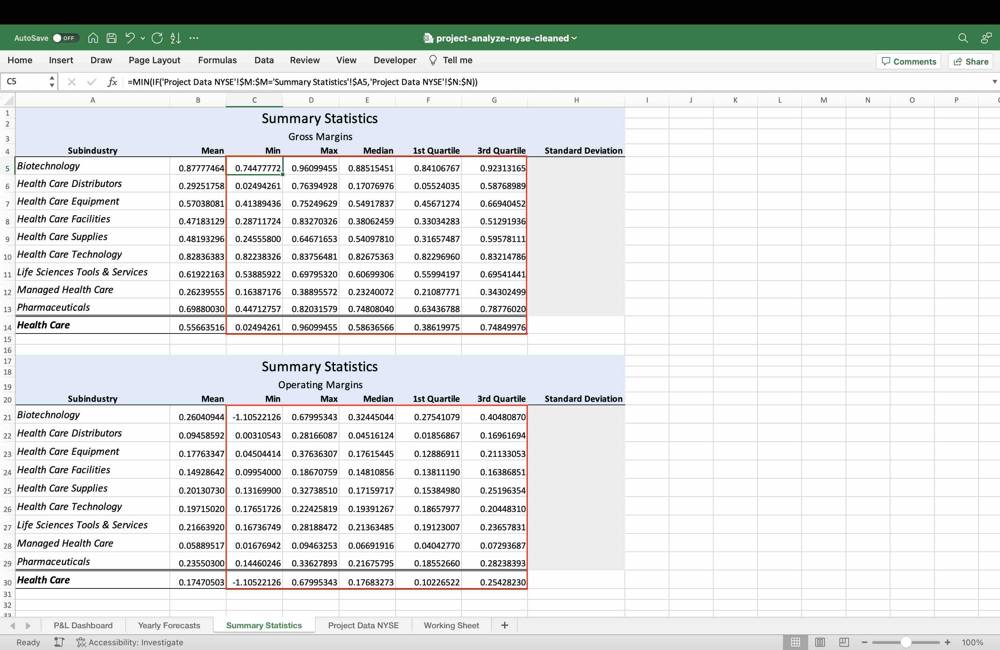

With our calculated summary statistics, we can now also graph the median gross margins and median operating margins comparing the healthcare subindustries to the sector whole.

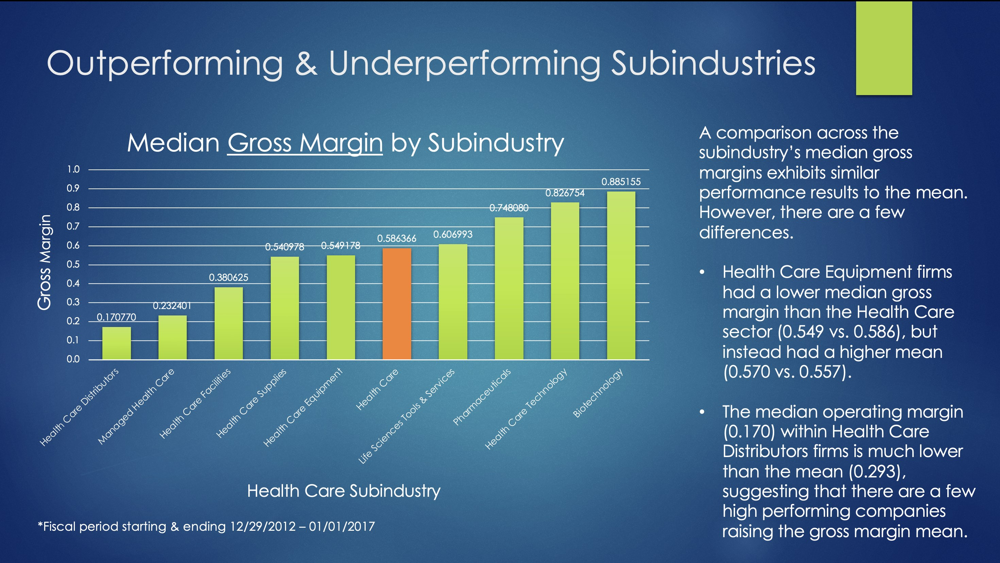

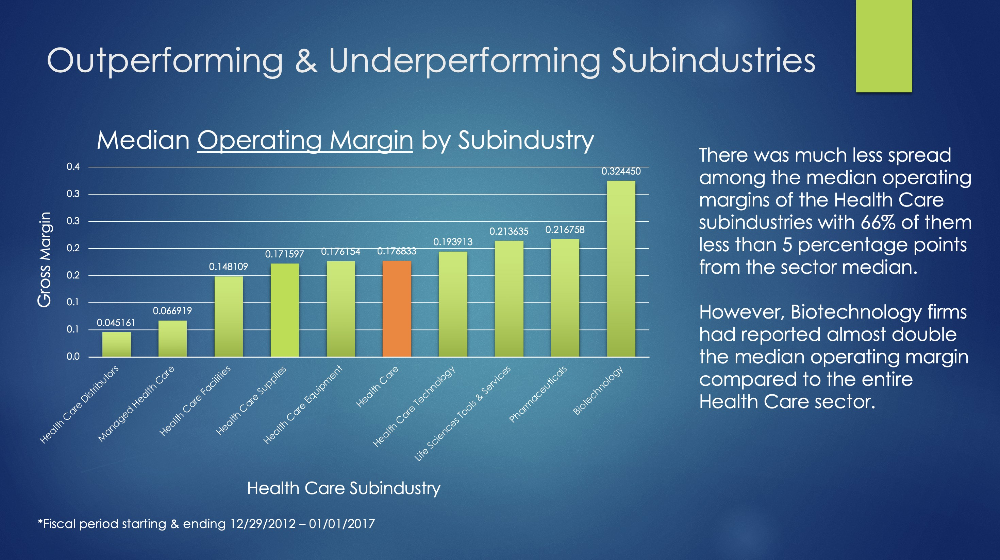

Now that we have our minimum, maximum, median, and 1st & 3rd quartiles, we can begin to answer more questions related to the spread and distribution of gross and operating margins across the healthcare sector and its subindustries.

Let's plot the data using a **box plot analysis** to visualize the statistical spread between subindustries and the sector.

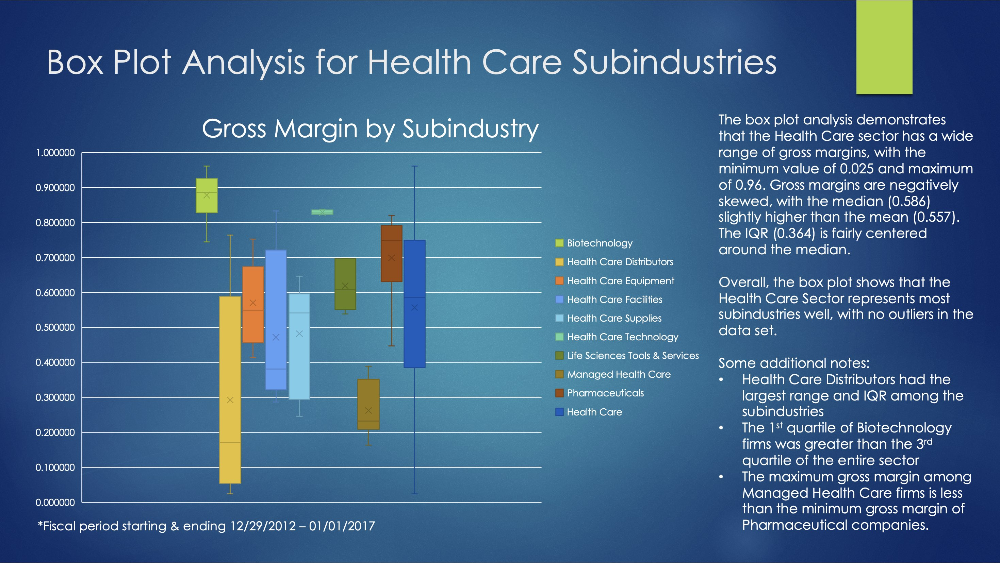

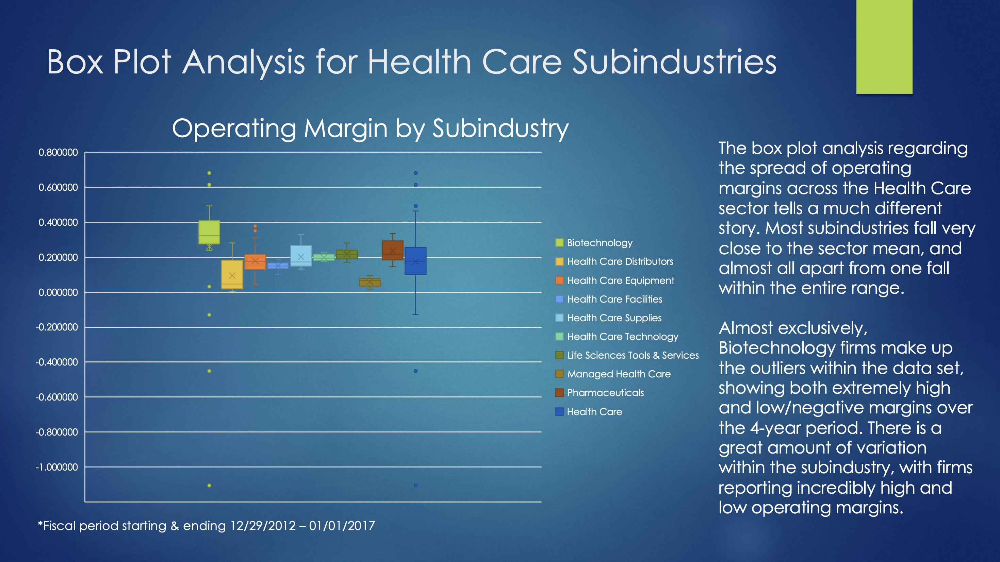

Before we can look at the distribution of the healthcare sector, we must find the **standard deviation**. Excel gives us two options when calculating the standard deviation: _STDEV.S_ estimates the standard deviation based on a sample, while _STDEV.P_ computes the standard deviation on the entire population. Since our dataset isn't too large nor is there much difficulty in gathering the gross margins within the entire sector, we can use the _STDEV.P_ formula to calculate the standard deviation of the population.

Nested inside our function is our **IF** function again:

_=STDEV.P(IF('Project Data NYSE'\\$L:\\$L='Summary Statistics'!$A14, 'Project Data NYSE'\\$N:\\$N))_

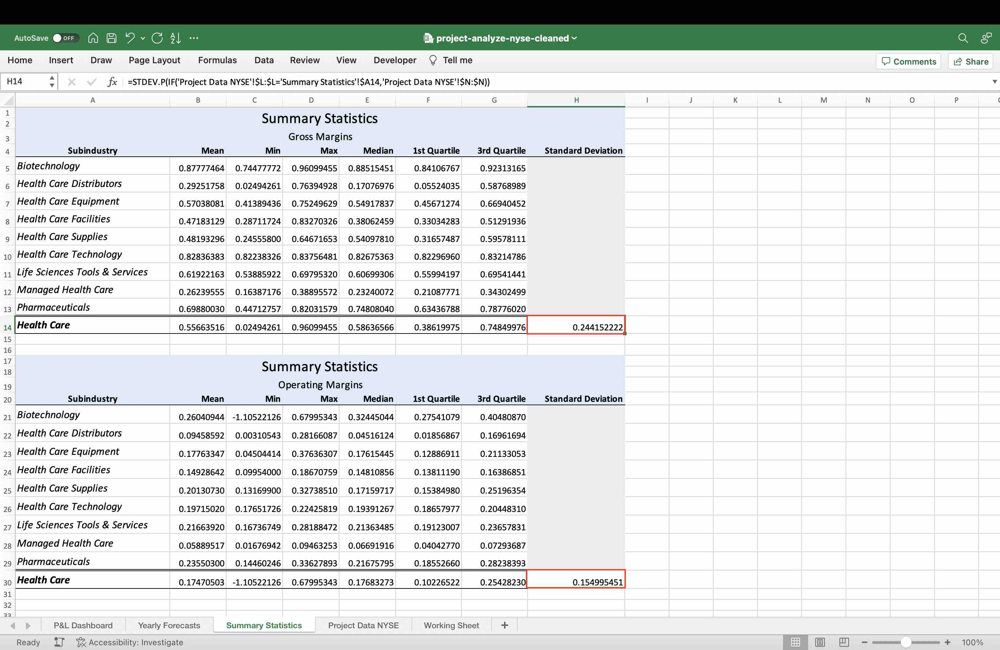

From here, I created a working sheet to gather the gross margins for each of the companies over the 4 years within the sector. These data points will allow us to plot the normal distribution of the healthcare sector. With the standard deviation calculated from before, we can now also plot the standard deviations from the healthcare sector mean.

Finally, we will compare the each of the subindustry's means against the normal distribution.

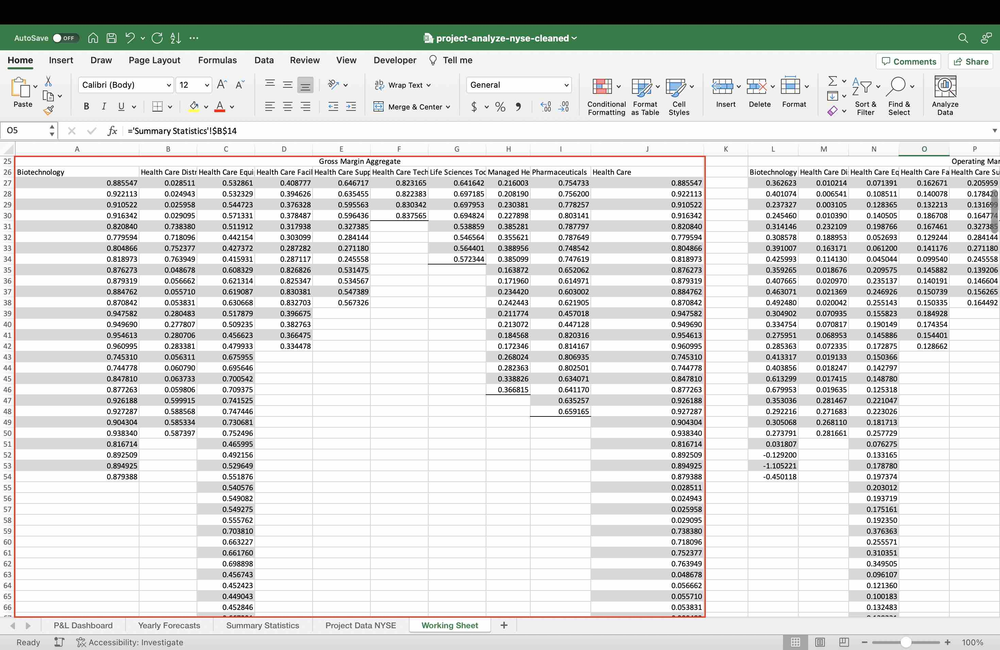

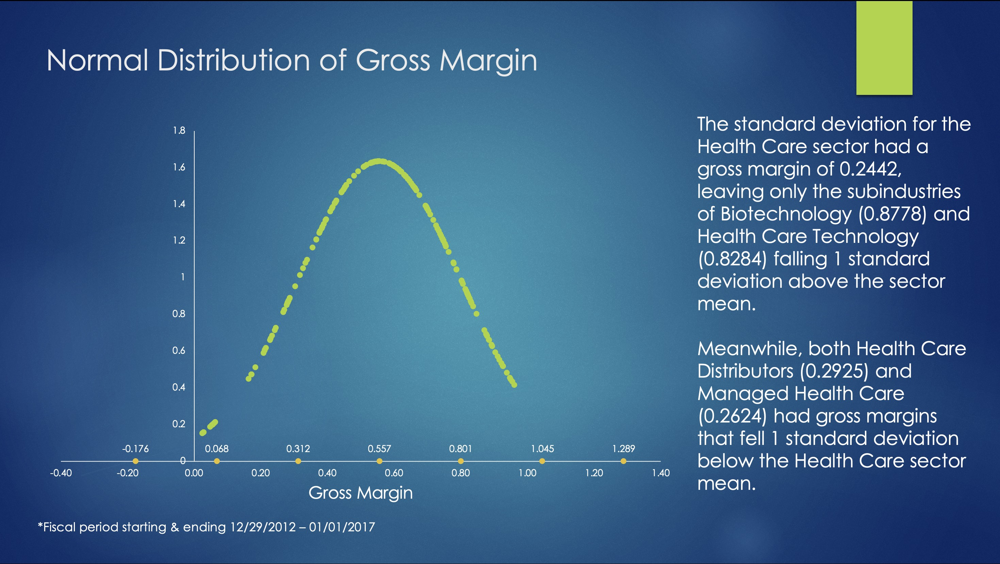

---

## Task \#2 - Develop a P&L dashboard

I have been asked to create a dashboard for a Profit & Loss Statement, which will calculate the Gross Profit, Operating Profit, and EBIT for all of the companies and years in which there is historical data available in the dataset. Each company and 1 of the 4 years are to be accessible from a drop-down list.

### Creating drop-down lists

Using the ticker symbol to represent the companies, I pulled the unique values from the mastersheet 'Project Data NYSE' Column B, along with the unique years 1 through 4 from Column C. The lists were exported & saved to the Working Sheet. 

After generating the unique company ticker values and years, we can create our drop-down lists using Data Validation, allowing for a list and referencing the Working Sheet sources previously created.

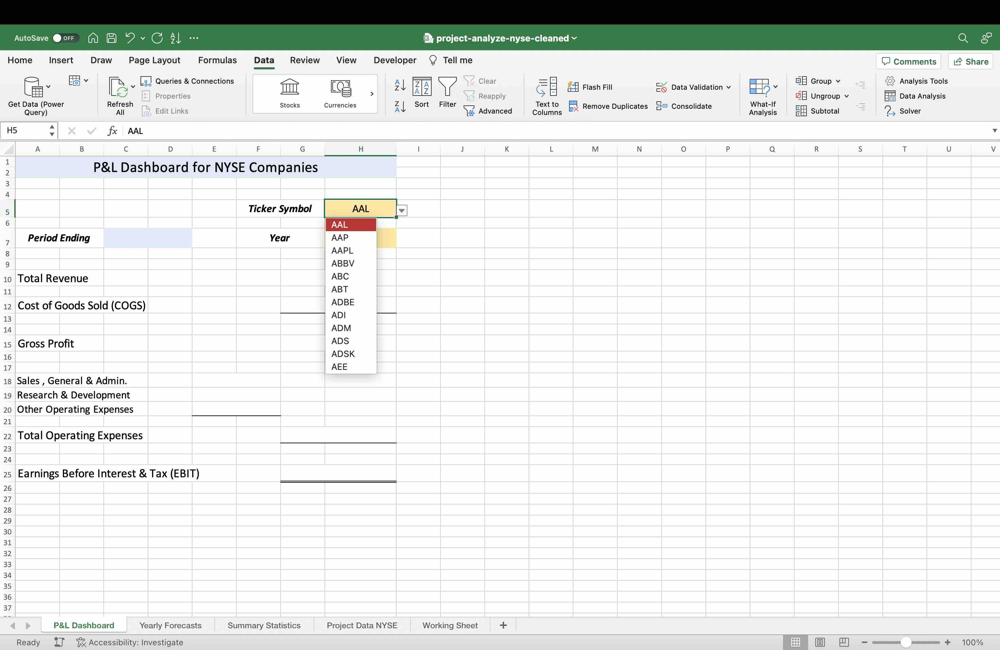

### Develop formulas for Dashboard

In order to create a dynamic dashboard that takes in multiple criteria, I will be using both the INDEX & MATCH functions in combination to successfully build the dashboard. The **INDEX** function will allow us to retrieve a specific value in our dataset/array based on its position, while the **MATCH** function will find or match a value within the dataset based on a given input and return it's position.

Therefore, I will nest the MATCH function inside our INDEX function, which will return the correct company and fiscal year information regarding the gross profit, operating profit, as well as the earnings before interest and tax. 

There are two forms of the INDEX function in Excel; one with an array as an input, the other with a reference as an input. There is only 1 array in our project from which we want to extract our data from, therefore we will use this first form of the function:

_=INDEX(array, row_num, [col_num])_

The first argument is the array, which will be set to the entire dataset from the Project Data NYSE sheet and will be locked as absolute, never changing: **'Project Data NYSE'\\$E:2\\$E:1711**

The second argument is where I nest the MATCH function to locate and feed the location of the value we are searching for within the array to the INDEX function. With regards to the optional 3rd argument [col_num], we only need Excel to search across the rows and therefore will be left blank. Here is the syntax for the MATCH function:

_=MATCH(lookup_value, lookup_array, [match_type])_

However, there are multiple criteria we want to match for within the dataset and not one specific value, but rather a value where two criteria are being met (both the company and the year). Remembering what we know about how Excel evaluates logical tests, I will set this lookup value to 1. The idea is that Excel will treat the 1 as TRUE, while 0 will equal FALSE.

Using our logical tests from the previous task whereby we set the array equal to the criteria/value to be matched, we can now build the formula with several criteria within our MATCH function. Each set of criteria added to the MATCH function will have to be multiplied against one another to result in a 1 within the lookup array when the each of the criteria is met, in order to match against the lookup value of 1 previously set, resulting in a TRUE statement.

Therefore, we need to match the instance where both the selected ticker symbol meets the selected year from our drop-down lists, and correctly fetches the data from the Project Data NYSE sheet. The MATCH function will therefore be:

_=MATCH(1, ('Project Data NYSE'\\$B:2\\$B:1711='P&L Dashboard'!H5)*('Project Data NYSE'\\$C:2\\$C1711='P&L Dashboard'!H7), 0)_

whereby the 1st criteria is matching the company ticker from cell H5 against the ticker column array, and the 2nd criteria is matching the year from cell H7 against the year column array. The final argument, _[match_type]_ will be set to 0 as to return an exact match.

This MATCH function will now be nested inside the INDEX function to return the correct position and therefore those values within the dataset. Let's set the array to search for the gross profit first (Column E in the master sheet):

_=INDEX('Project Data NYSE'\\$E:2\\$E:1711, MATCH(1, ('Project Data NYSE'\\$B:2\\$B:1711='P&L Dashboard'!H5)*('Project Data NYSE'\\$C:2\\$C1711='P&L Dashboard'!H7), 0))_

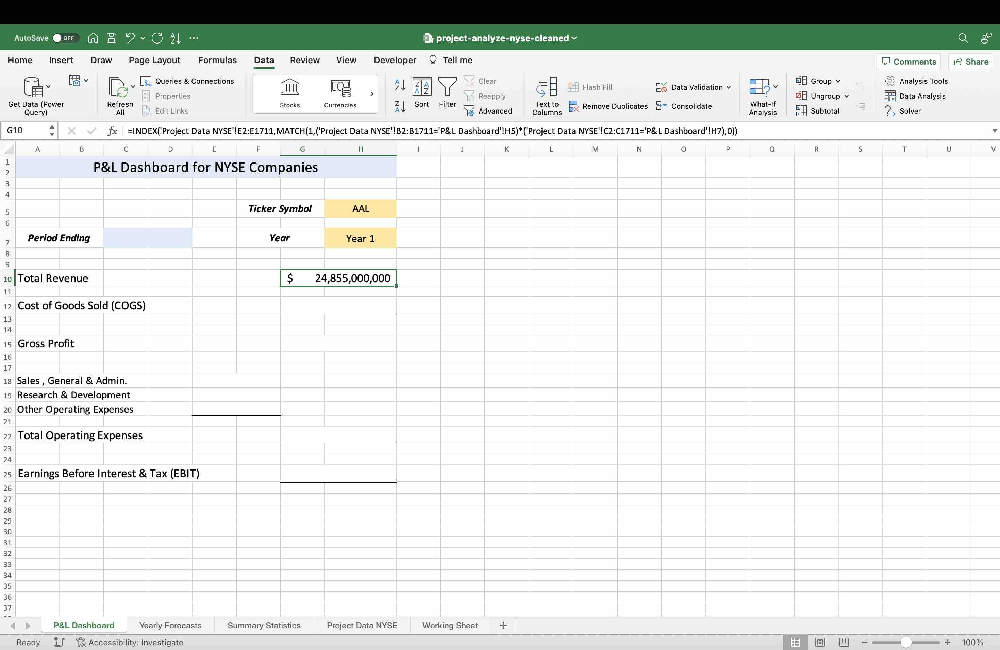

The formula can now be altered to reference the COGS and other operating expenses, along with the calculated difference for the gross profit and EBIT. After applying some conditional formatting to the cells, the dashboard is ready for use. Two examples are included below.

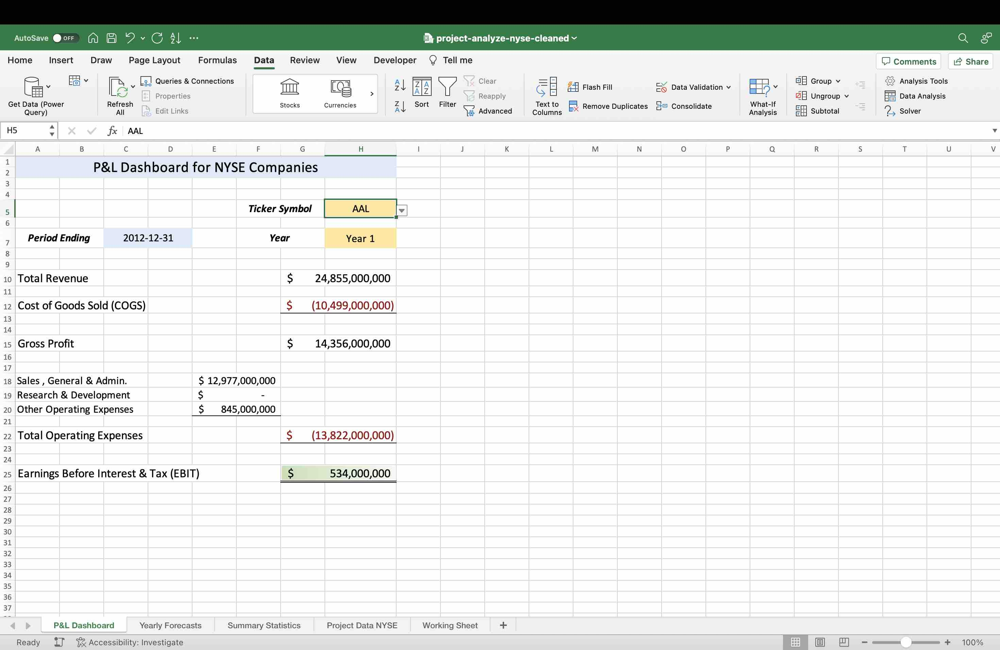

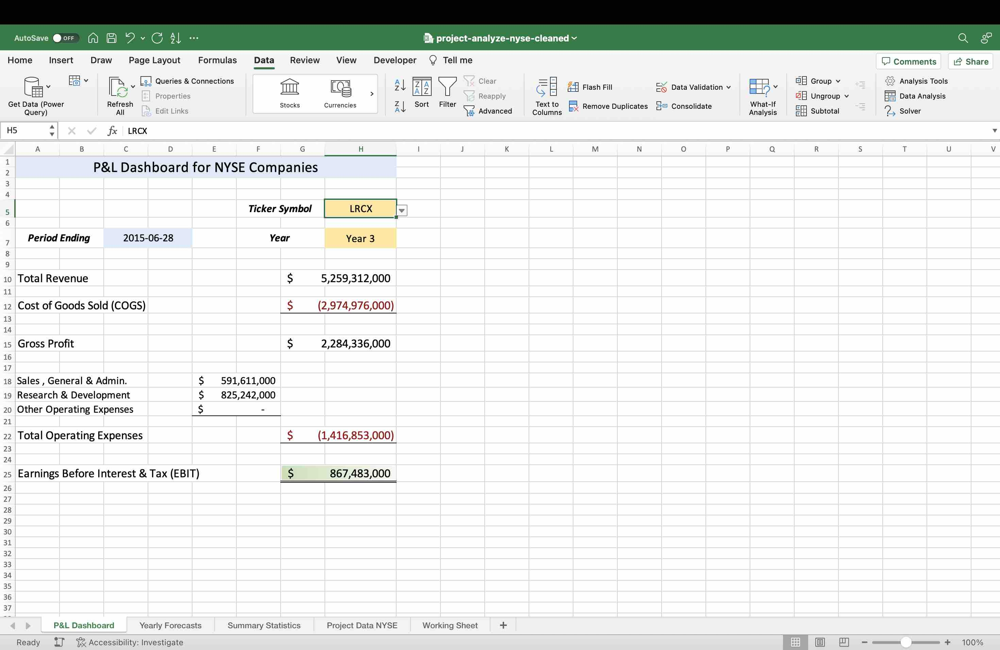

---

## Task \#3 - Create a financial forecasting model with scenarios

In this final task, I am required to build a financial model for a particular company which forecasts the Gross Profit, Operating Profit, and EBIT for **two more years** using **three scenarios** (Best case, Base case & Worse Case). All of the assumptions for revenue growth, gross margins, and operating margins should change for each scenario.

### Setting up the model

After analyzing the healthcare sector from the previous task, I have decided to build my financial model around the 7 **Biotechnology** firms rather then focus on one particular company from the NYSE data. The very high and low margins compared to the other subindustries compelled me to develop a forecasting dashboard for these specific firms.

Using the dashboard design I created from the previous task, we can begin building the forecasting model starting with the 4 years of data we currently have. The 7 firms will be accessible through a drop-down menu, along with the 3 forecasting scenarios, which I have named **Best Case, Base Case & Worst Case**.

In addition to the model, I created two separate tables underneath the dashboard. The first is a table with the respective growth rates and margins for each of the 3 scenarios; while the second table provides the calculated historical growth percentages and margins. These calculated figures would assist any user in making more informed, realistic assumptions for the scenarios.

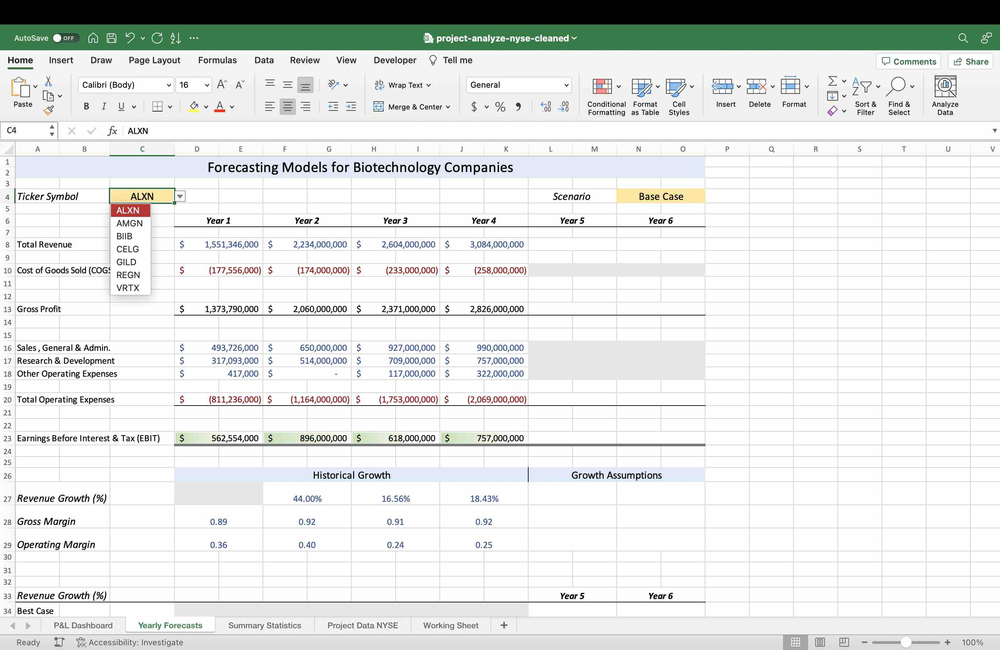

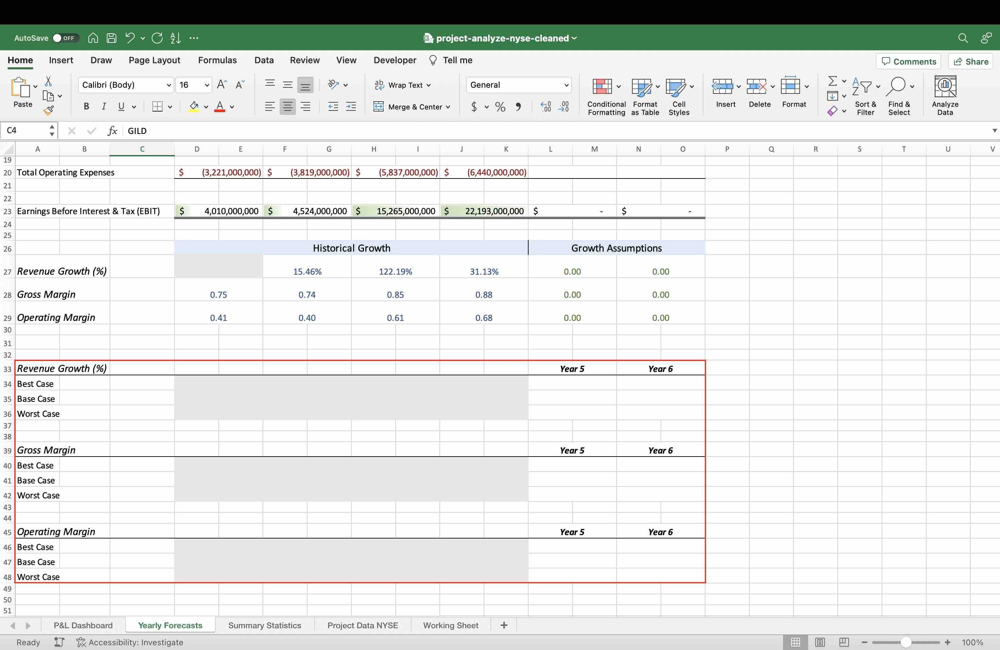

### Determining Assumptions

For each company within the subindustry, all forecasting scenarios were kept near their historical figures. A disclaimer should be made in that determining these assumptions is not the focus of the task, but rather implementing the correct functions and building interactive dashboards.

All assumptions are saved below.

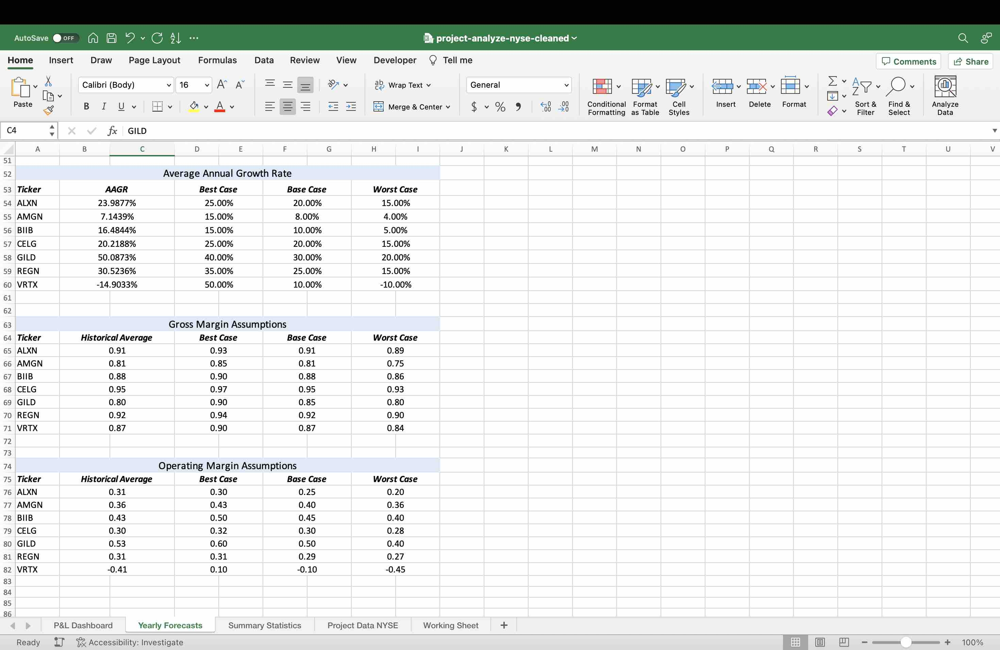

### Build Formulas to Gather Assumptions

With our determined assumptions for each of the 3 scenarios for all 7 companies, we can build nested formulas to extract the correct assumptions for our dashboard given the selected company and scenario. The formula will be similar to the one previously built in Task #2, but with **two MATCH functions** nested inside the **INDEX** since we need to search by both the _row_num_ and _[col_num]_ within our created arrays this time.

Let's start with the first array, the growth assumptions for revenue. The first argument for the INDEX is the array: **\\$A\\$53:\\$I:\\$60**, locking the cell references.

Next, I want to build two MATCH functions to nest inside the second and third arguments, the _row_num_ and _[col_num]_ respectively. We can begin by building the first MATCH function to locate the position of the row from the array.

Our first argument is the _lookup_value_ which will be set to **\\$C\\$4**, the cell with the drop-down company ticker name. The second argument is the _lookup_array_ **\\$A\\$53:\\$A\\$60** only searching within Column A to find/match the value in C4 within the array, returning the row position. The final argument _[match_type]_ is set to **0** to return an exact match. Below is the full function:

_=MATCH(\\$C\\$4,\\$A\\$53:\\$A\\$60,0)_

The second MATCH function will now return the column position in the array. The first argument is **\\$A34**, the scenario we're searching for within the array. Locking only the column will allow us to drag the formula down and across the new array when searching for other revenue scenarios. Our second argument is **\\$A\\$53:\\$I\\$53**, searching across the row to find the matching scenario and column position. The _[match_type]_ will be set to **0** again.

_=MATCH(\\$A34,\\$A\\$53:\\$I\\$53,0)_

We can now piece together the final formula with the nested MATCH functions inside our INDEX:

_=INDEX(\\$A\\$53:\\$I:\\$60, MATCH(\\$C\\$4,\\$A\\$53:\\$A\\$60,0), MATCH(\\$A34,\\$A\\$53:\\$I\\$53,0))_

Creating these formulas for the gross margin and operating margin assumptions will follow a similar pattern. We are now able to successfully reference the correct company assumptions when selected.

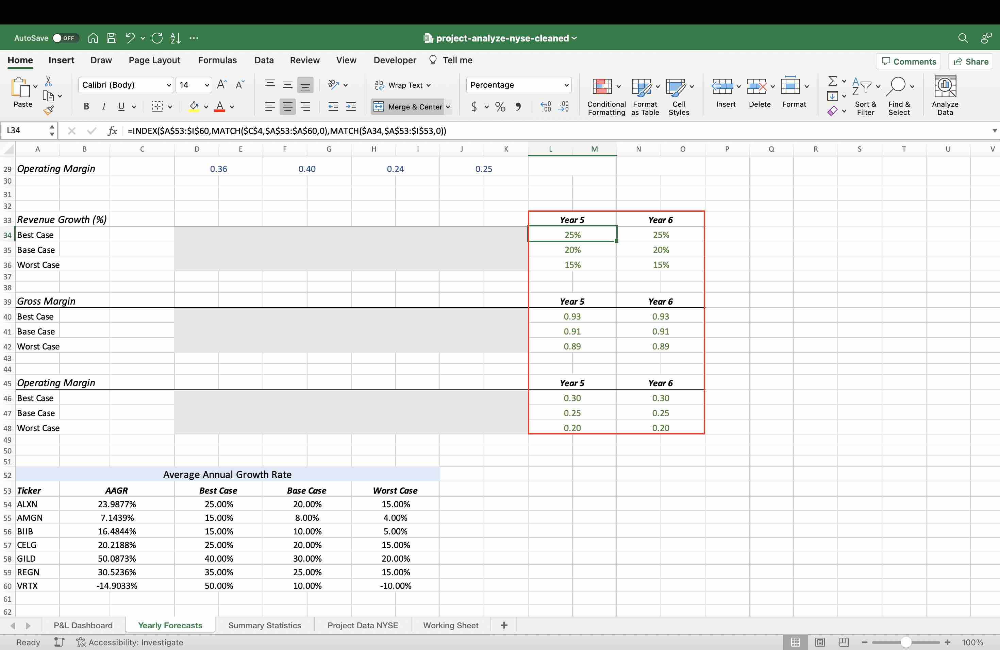

### Build Formulas to Reference Assumptions

In order to now reference the correct assumptions based on the selected scenario, I will introduce another function called **OFFSET**. This function will return us a value from a cell, starting from a given reference and moving a specified number of rows and/or columns from that reference. Since our first original table contains the respective growth rates **underneath** the given year, we can nest another **MATCH** function inside the OFFSET to correctly return the numbered position from the starting reference. 

The MATCH function will become the second argument in the OFFSET function, returning the number of rows to move down to the correct growth and margins values associated with the selected scenario. Here is the OFFSET syntax:

_=OFFSET(reference, rows, cols, [height], [width])_

Building the formula for the Year 5 Revenue Growth, the first argument is the starting reference which is our year, cell **\\$L\\$33**. The MATCH function will make up our second argument, **MATCH(\\$N\\$4,\\$A\\$34:\\$A\\$36,0)**, returning us 3, the position of the lookup value from the lookup array (N4 is our scenario case). The final necessary argument is the cols, or number of columns to move to the right of the reference cell. This value is set to **0** as we don't need to move across any columns since our array is directly below the year.

_=OFFSET(\\$L\\$33, MATCH(\\$N\\$4,\\$A\\$34:\\$A\\$36,0), 0)_

This formula can be created for both the gross margin and operating margin references.

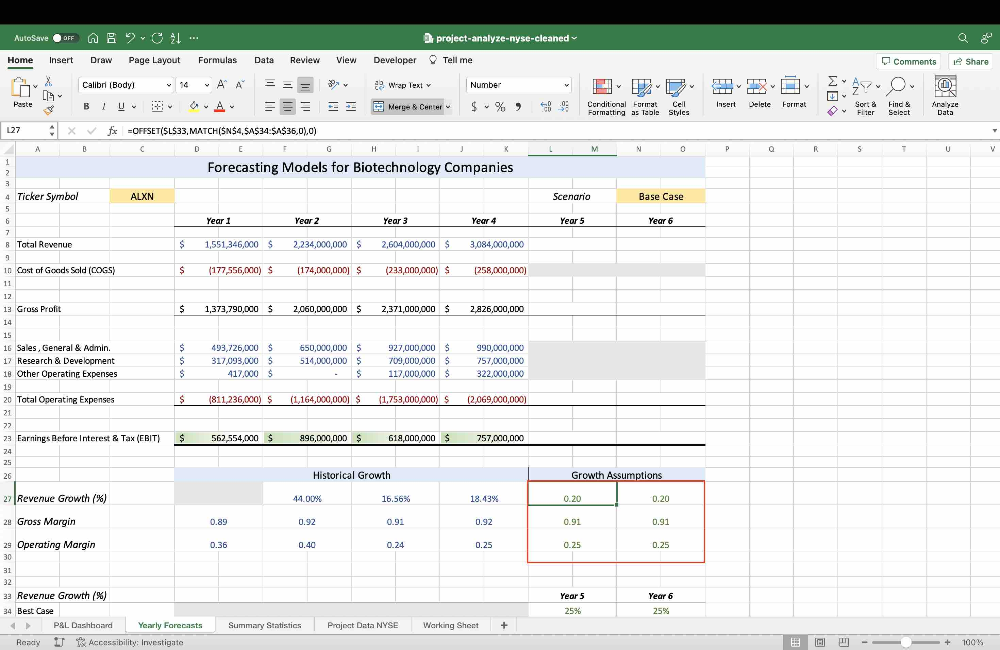

We now have everything needed to forecast our Gross Profit, Operating Profit, and EBIT for each company and their three scenarios. After creating formulas that use the referenced values to calculate forecasted revenue and margins, the forecasting dashboard is ready for use.

Below demonstrates two examples.

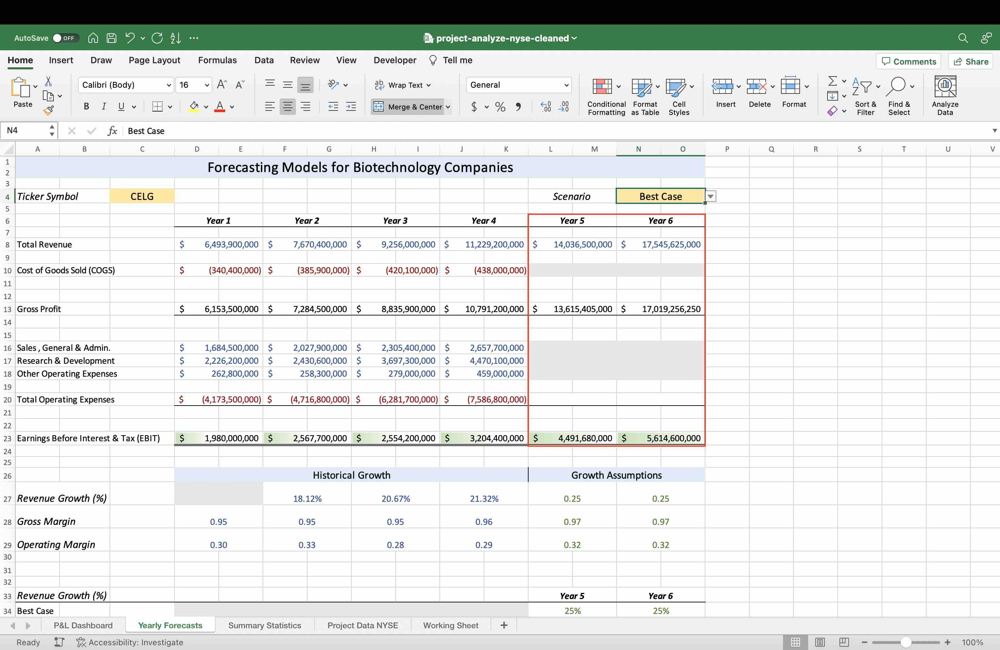

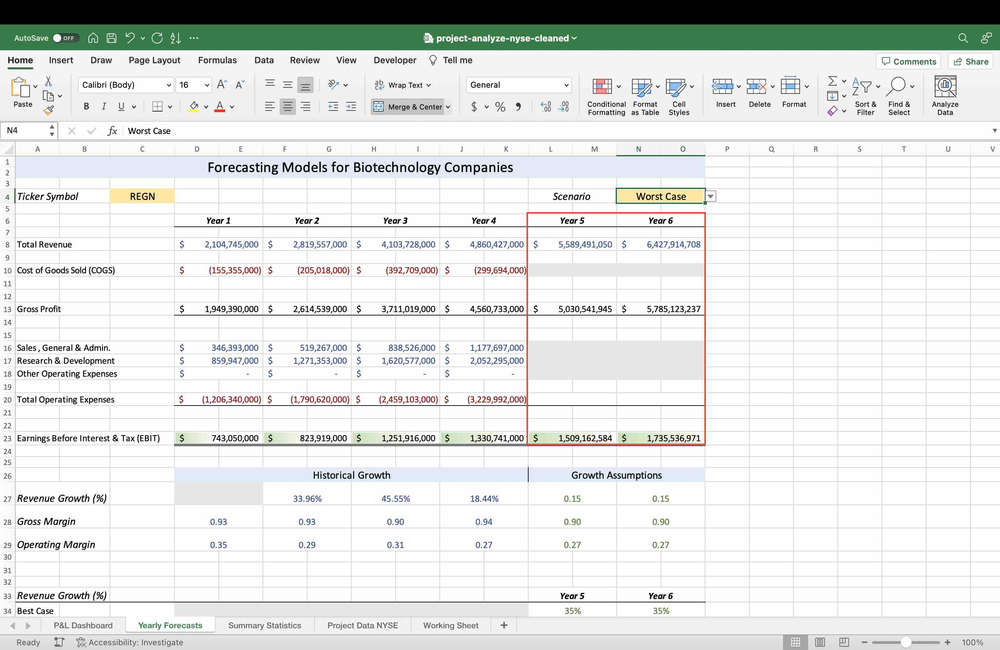